# Using model Training to clean-up data and then train an Image Classifier

Before training an image classification model, we need labelled data. The data used will be sources from the internet using DuckDuckGo search engine.

To clean up this data, that is, to remove noise, incorrect images, and images that are incorrectly labelled, we will first need to train a model. This approach helps improve the training process.
> **Disclaimer!** The activities in this notebook are based on [fastai DL course(Lesson 2) by Jeremy Howard on YouTube](https://youtu.be/F4tvM4Vb3A0)

## Image classifier for different types of vegetable plants

Farmers can use DL for Image classification tasks, that focus on predicting the category (e.g. type of vegetable) of the object in an input image.

_Veggie detector_ is a model trained to identify the crop/vegetable type/species contained in an image.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)


# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## Installing core dependencies

In [2]:
iskaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

if iskaggle:
    !pip install -Uqq fastai duckduckgo_search

from duckduckgo_search import ddg_images
from fastcore.all import *

## Setting up access to training data

### DDG search configuration

We will be using duckduckgo to search images that will be used to train our detector.

In [3]:
# search for images on ddg
def search_images_ddg(term, max_images=200):
    """
    Returns a list of urls to individual images.
    """
    print(f"Searching for '{term}'")
    result = ddg_images(term, max_results=max_images)
    return L(result).itemgot('image')

In [4]:
# testing the image search functionality
cabbage_images = search_images_ddg('Cabbage transparent', 3)

print(f"Found {len(cabbage_images)} cabbage urls.")
cabbage_images

Searching for 'Cabbage transparent'


/opt/conda/lib/python3.10/site-packages/duckduckgo_search/compat.py:40: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")


Found 3 cabbage urls.


(#3) ['https://purepng.com/public/uploads/large/purepng.com-cabbagecabbageplantvegetablesgreen-1701527241612rknlx.png','https://www.pngplay.com/wp-content/uploads/2/Cabbage-Transparent-File.png','https://purepng.com/public/uploads/medium/purepng.com-cabbagecabbageplantvegetablesgreen-1701527242074aep5u.png']

The DDG search has successfully returned a list of Cabbage URLs that it can find from the search term, `Cabbage transparent`.

**NB**: You cannot be sure what will be on the search results. It is important to exercise caution before displaying or using these images. But they are mostly fine. The following image is a sample of results on the ddg web search engine for the term `Cabbage transparent`.

![](https://raw.githubusercontent.com/mwanginjuguna/public-image-assets/main/veggie-detector/ddg-cabbage-transparent-result.png)

It's great. But if you scroll down many times, you will start to notice inconsistencies such as cooked cabbage meals and other variations. Stay alert.

**Download images from the urls returned by search_images_ddg**

In [5]:
# first, where to save the images
destination = 'images/cabbage_image.jpg'

# then, a download utility from fastai library
from fastdownload import download_url

download_url(url=cabbage_images[0], dest=destination, show_progress=True)

Path('images/cabbage_image.jpg')

**Load the saved images**

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


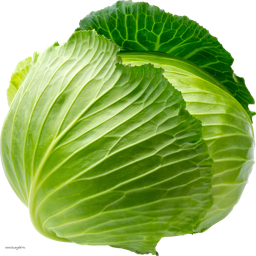

In [6]:
from fastai.vision.all import *

cabbage_img = Image.open(destination)
# scale image to a small size
cabbage_img.to_thumb(256,256)

**The search setup/config is complete**

We can use the above functionality to search on ddg, save, and load any images. Now we can focus on obtaining the necessary data for training.


### DDG web-search to Set up the categories
The next step is to save the data we need into categories. Each category is a folder with images for each vegetable our model can detect, e.g., `cabbages`, `kales`, etc. We will start with a few categories.

In [8]:
search_categories = 'cabbage', "lettuce", "spinach", "kales", "broccoli"
path = Path('vegetables') # main folder for all categories

from time import sleep

# download images trying different terms to obtain a variety per category

for category in search_categories:
    dest = (path/category) # folder structure per category, e.g., 'vegetables/cabbage'
    dest.mkdir(exist_ok=True, parents=True) # creating the folders
    
    download_images(dest, urls=search_images_ddg(f"{category} photo", 32))
    sleep(10) # pause between downloads
    
    download_images(dest, urls=search_images_ddg(f"{category} vegetable plant photo", 16))
    sleep(10)
    
    download_images(dest, urls=search_images_ddg(f"{category} transparent photo", 16))
    sleep(10)
    
    download_images(dest, urls=search_images_ddg(f"{category} plant photo", 32))
    sleep(10)
    
    resize_images(path/category, max_size=256,dest=path/category) # resize the images

Searching for 'cabbage photo'
Searching for 'cabbage vegetable plant photo'
Searching for 'cabbage transparent photo'
Searching for 'cabbage plant photo'


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Searching for 'lettuce photo'
Searching for 'lettuce vegetable plant photo'
Searching for 'lettuce transparent photo'
Searching for 'lettuce plant photo'
Searching for 'spinach photo'
Searching for 'spinach vegetable plant photo'
Searching for 'spinach transparent photo'
Searching for 'spinach plant photo'


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Searching for 'kales photo'
Searching for 'kales vegetable plant photo'
Searching for 'kales transparent photo'
Searching for 'kales plant photo'
Searching for 'broccoli photo'
Searching for 'broccoli vegetable plant photo'
Searching for 'broccoli transparent photo'
Searching for 'broccoli plant photo'


/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/PIL/Image.py:992: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


#### DDG web-search strategy
To get the best photos from duckduckgo, I conducted few search experiments. The main goal was to see how the variations in the search term changes the ddg results. I tried the following terms for `cabbages, kales, spinach, and brocolli` categories _(I will only use cabbage category to illustrate)_:
* `cabbage`
* `cabbage photo` - better results than `cabbage`
* `cabbage plant`
* `cabbage plant photo` - almost same to cabbage plant
* `cabbage vegetable plant photo` - better results for most categories.
* `cabbage transparent photo` 

Some observations:
* When using only the category name as the search term, the results include multiple variations _(e.g food, chopped, etc)_ that create a lot of noise.
* Most of the results are very straight forward for `cabbage`. The other categories start to mix up in the results after a few first results. For example, searching for `kale transparent photo` only gives a few correct results, and the rest are mixed up with other categories. _(This noise makes it difficult for the model to learn)._
* Adding `farm` can help improve results for specific categories. However, it creates a lot of noise that is not easy to filter without going through the items manually.

Generally, the results go from good to worse as the number increases. To address challenge, more focuse should be given on the top results from each search. Although this removes noise, the cost is some great results are also ignored in the process.

#### Image Clean up
All images have been downloaded. We need to clean up the ones which failed to download.

In [9]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
print(f"{len(failed)} Images failed and we have removed them.")

7 Images failed and we have removed them.


## Preparing the Data

We need to prepare the data we have just downloaded, and turn it into a format that is fit for training the model.

For this task, we will load our data using fastai's `DataLoaders`. 

> **DataLoaders:** A fastai class that stores multiple DataLoader objects you pass to it, normally a train and a valid, although it's possible to have as many as you like. The first two are made available as properties. [fastbook from fastai](https://github.com/fastai/fastbook/blob/master/02_production.ipynb) 

To turn the data of the vegetables that we downloaded into a `DataLoaders` object, we need to tell fastai atleast the following:
* What kings od data we are working with (independent variables,(x=images), and dependent variables (y=categories(type of vegetables) for each image).
* How to get the list of items - Items are file paths.
* How to label these items - Folders represent the labels for each category
* How to create the validation set - fix a random seed

Also, we will apply transforms to our data, where we resize each image in the mini-batch to ensure we feed the model images that are similar.

In [10]:
# create a `DataBlock` object == `DataLoaders` template
vegetables = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=32),
    get_y=parent_label,
    item_tfms=Resize(128)
)

# tell fast ai the source of images
dataloaders = vegetables.dataloaders(path)

#### A peek into the data

In fastai, `DataLoaders` includes validation and training `DataLoader`s. A `DataLoader` is a class that provides batches of a few items at a time to the GPU. By default it contains 64 items stacked into a single items. We can preview the contents of our `DataLoader` by calling `show_batch` method.

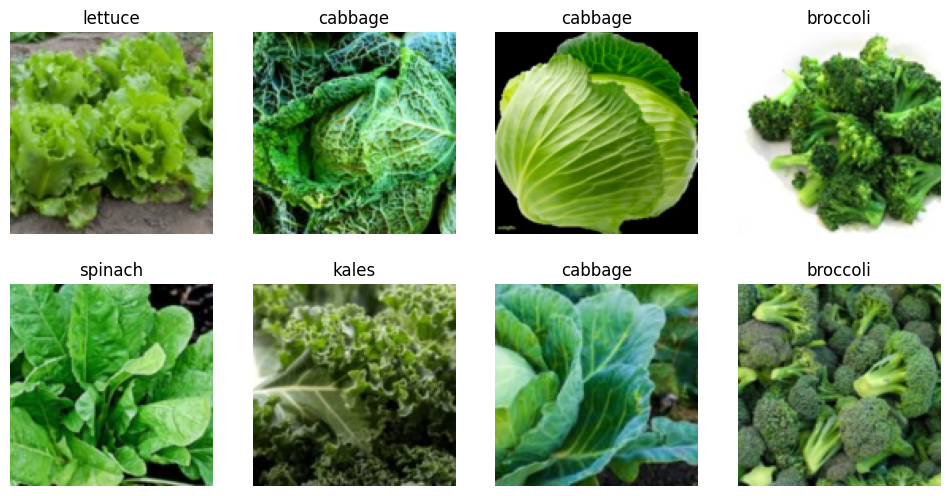

In [12]:
dataloaders.train.show_batch(max_n=8, nrows=2) # show at-most 8 items in 2 rows

The default `Resize`, applies _cropping_ on the images to fit the requested size. We can use different resize methods. Each has benefits and disadvantages. Some alternatives in fastai include pad, and squish/stretch which do not provide us with much to work with.

Another alternative, which we will use is to apply Cropping, but in different parts of the image. So on each **epoch**, we will provide the model with a different part of the image. This approach is more realistic because the model gets to learn to focus on and recognize different features in the images.

We need to substitute `Resize` with `RandomResizedCrop` as follows:

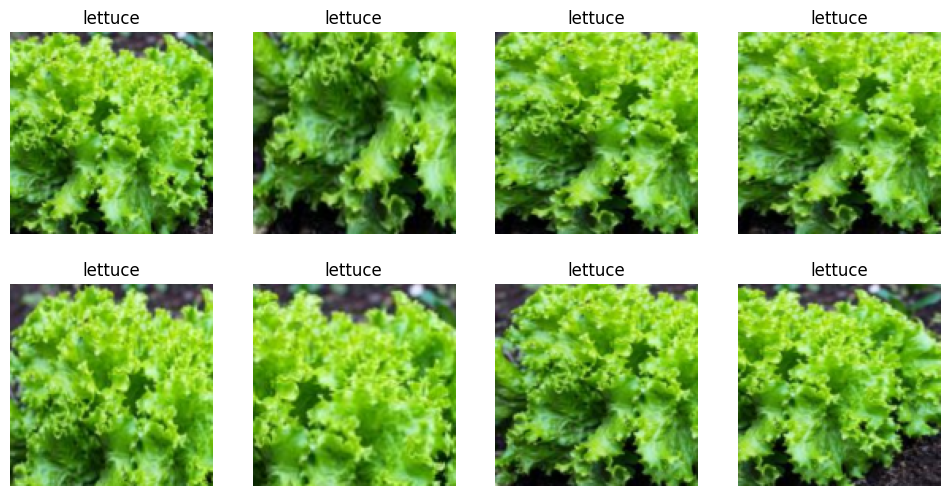

In [13]:
vegetables = vegetables.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dataloaders = vegetables.dataloaders(path)
dataloaders.train.show_batch(max_n=8, nrows=2, unique=True)

This _data augmentation_, since `unique=True` ensures that each image is repeated with different versions of the `RandomResizedCrop`.

### Data Augmentation

_Data augmentation_ refers to creating random variations of our input data such that they appear different without changing the meaning of data. Common techniques in data augmentation include:
- Rotating
- Flipping
- Perspective warping
- Brightness Changes
- Contrast Changes

Since we are using images in the same size, we can apply the transformations/augmentations to an entire batch using the GPU to save time. We use `batch_tfms` parameter. For the differences to be clear, we use double amount of augmentation, and do not use `RandomResizedCrop`.

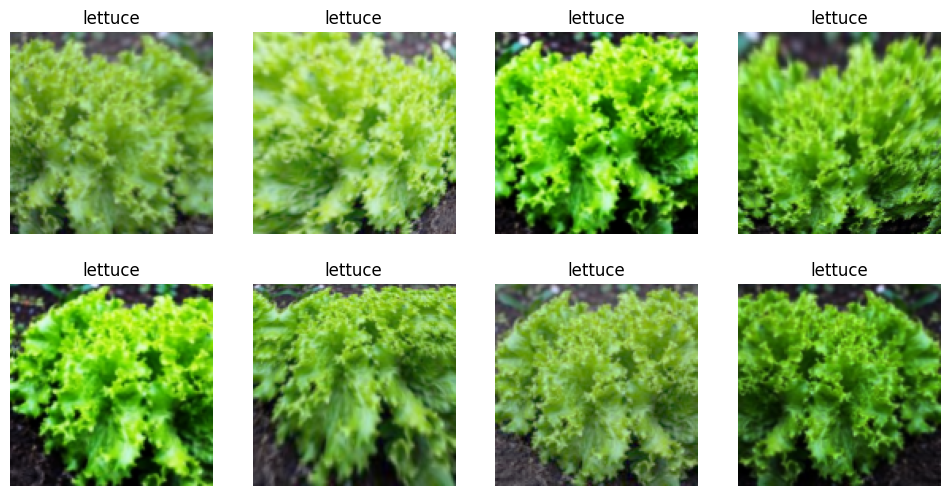

In [14]:
vegetables = vegetables.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dataloaders = vegetables.dataloaders(path)

dataloaders.show_batch(max_n=8, nrows=2, unique=True)

The data is ready.

## Training the model
Now that we have the data, it  is time to train the model.

![](https://qph.cf2.quoracdn.net/main-qimg-01c4bc1990d3b0b1c75cf0c1b9fabc3d)

### Training the Model and Using it to Clean Up Data


Our Data is as follows:
 - Brocolli - 91 image files
 - kales - 88 image files
 - spinach - 94 image files
 - cabbage - 117 image files
 - lettuce - 93 image files

In [15]:
vegetables = vegetables.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)

dataloaders = vegetables.dataloaders(path)

Let's now create a`Learner` from a resnet model and fine-tune it.

In [16]:
learn = vision_learner(dataloaders, resnet18, metrics=error_rate)
learn.fine_tune(8)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 61.3MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,2.477653,1.411953,0.427083,00:02


epoch,train_loss,valid_loss,error_rate,time
0,1.165258,0.749780,0.250000,00:01
1,0.990057,0.525795,0.187500,00:01
2,0.813692,0.415578,0.156250,00:01
3,0.689713,0.361817,0.125000,00:01
4,0.581024,0.389991,0.104167,00:01
5,0.492730,0.378251,0.114583,00:01
6,0.433766,0.380816,0.104167,00:01
7,0.383423,0.381597,0.104167,00:01


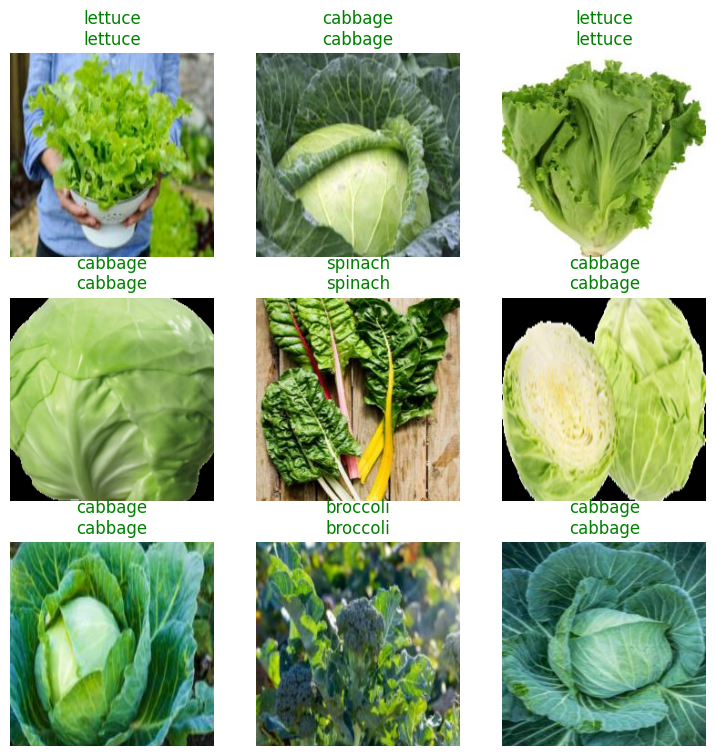

In [17]:
learn.show_results()

#### Confusion Matrix
Since our model will be trying to predict categories, we can use confusion matrix to visualize whether and where, the model is making mistakes.

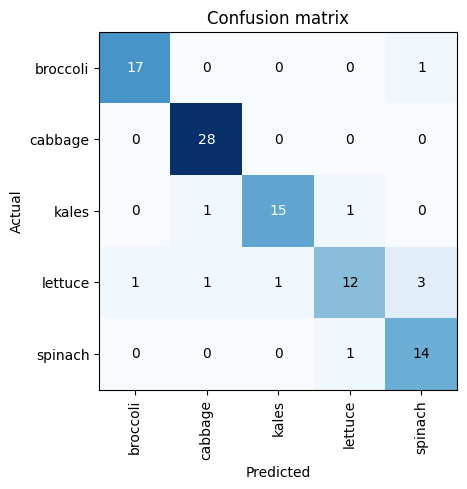

In [18]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

Based on this confusion matrix, we can observe that it does well in classifying or predicting most of the images into the actual categories. We can tell which are the hard ones.

For example, it correctly predicts all brocolli images into their actual category. However, there are some difficulties: it seems to confuse lettuce for spinach, and also confuses kales for spinach lettuce and broccoli apart from cabbage.

We need to clean up the data further to see if we can reduce the confusion and improve performance.

## Data Cleanup

Let's start by first determing the top losses. A `loss` is higher if the model is incorrect, or if it is correct, but not confident of its correct answer.

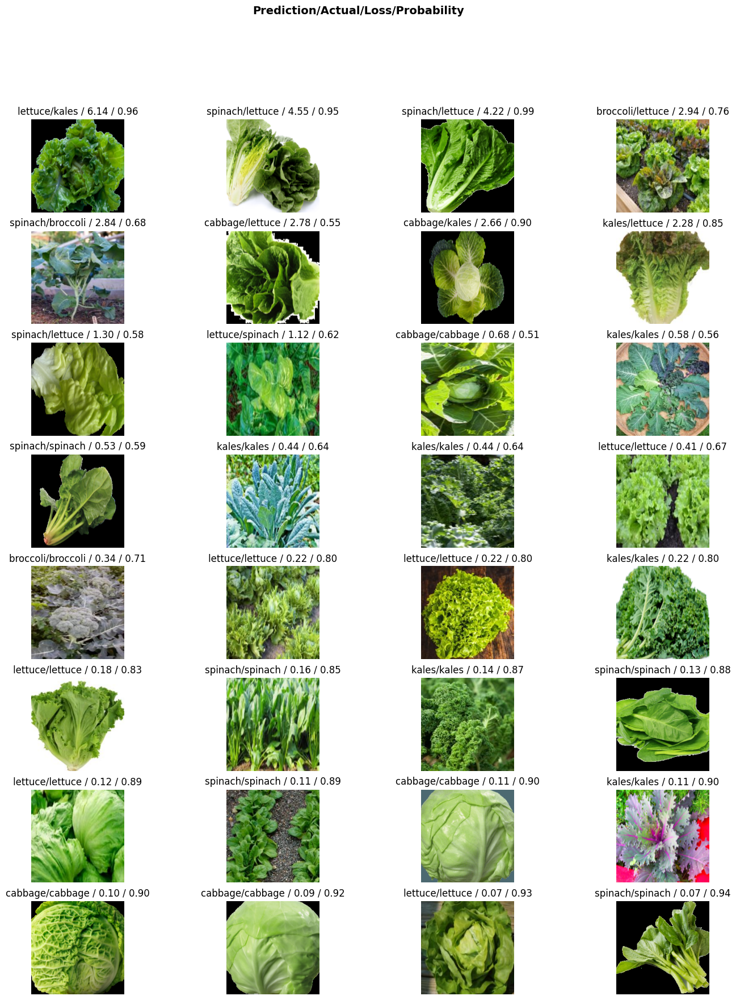

In [20]:
interpretation.plot_top_losses(32, nrows=8, figsize=(17,20))

We can observe that the model makes mistakes while the loss is somewhere between 0.72 and 0.91

We can now clean up some data that is wrongly labelled. fastai widgets provides`ImageClassifierCleaner` GUI object for data cleaning allowing us to select the categories for items with the highest losses.

In [21]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn) # runs the model
cleaner

After mapping them into the right categories or for delete, let's clean up.

In [27]:
for idx in cleaner.delete(): # remove ones we marked delete
    cleaner.fns[idx].unlink()
    
for index, category in cleaner.change(): # change to correct category
    shutil.move(str(cleaner.fns[idx]), path/category)

## Some general tips from Jeremy Howard
* Some data (images in the categories) can be hard to work with for the model. For example, if an image contains multiple objects. It will be hard to classify compared to an image with just one object.
* `ImageClassifierCleaner` object is used to clean the data.
* Technique - Always Train the model before starting to clean up data. 
    - _This technique helps in identify what the model is having difficulties in classifying, allowing for improvising the training approach. You get an opportunity to decide what to do next._
    - This technique helps idenfity strategies for new datasets, new training strategies, or trying new model among others.

## Recap

We are trying to create an image classifier that can be used to detect images of specific vegetables (i.e., cabbage, spinach, broccoli, kale, and lettuce)

This far, we have done the following:
- We downloaded data and put it into categories (different types of vegetables - folders)
- We trained a model using `resnet-18` pretrained model
- We cleaned up data by identifying the losses from the model's performance.

Now we have clean data. Let's put it to create the final model now.

# Creating a the veggie detector

Now that we have better data at our hands, we need to retrain the model.

This time, we will use a higher pre-trained model resnet-34 or resnet-50.

In [38]:
vegiesDataBlock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=64),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)

vegiesDataloaders = vegiesDataBlock.dataloaders(path)

clean_learner = vision_learner(vegiesDataloaders, models.resnet50, metrics=error_rate)
clean_learner.fine_tune(13)

epoch,train_loss,valid_loss,error_rate,time
0,2.169898,1.191996,0.431579,00:02


epoch,train_loss,valid_loss,error_rate,time
0,1.021613,0.711678,0.231579,00:02
1,0.781343,0.555446,0.189474,00:02
2,0.693122,0.437825,0.168421,00:02
3,0.609767,0.330603,0.136842,00:02
4,0.535114,0.229770,0.094737,00:02
5,0.474872,0.197688,0.063158,00:02
6,0.411166,0.180247,0.052632,00:02
7,0.373515,0.162630,0.063158,00:02
8,0.333189,0.172372,0.063158,00:02
9,0.299442,0.163766,0.063158,00:02


**Let see some results.**

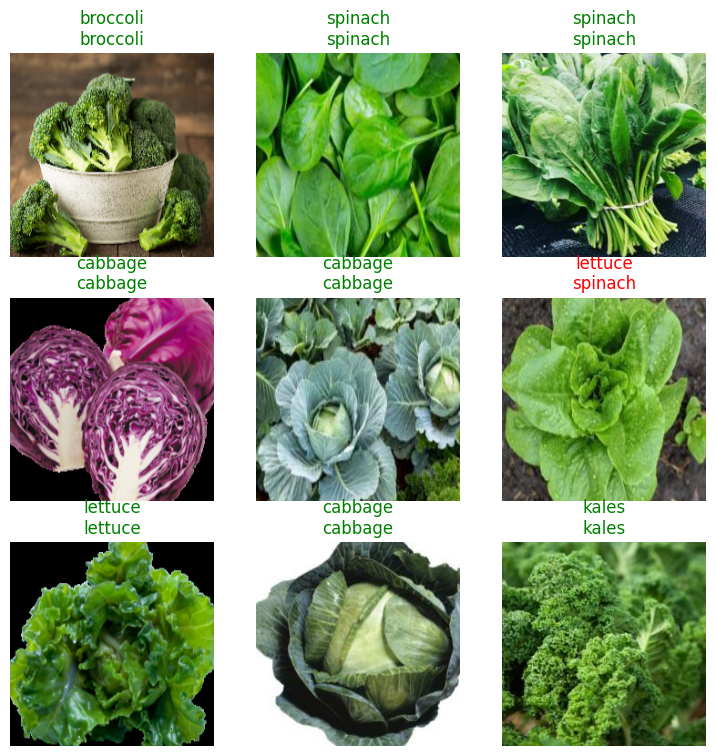

In [39]:
clean_learner.show_results()

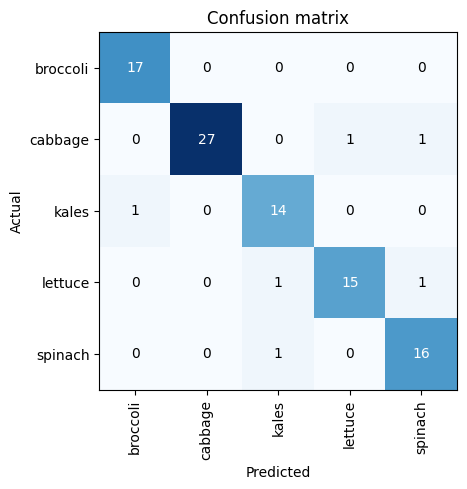

In [40]:
interp = ClassificationInterpretation.from_learner(clean_learner)
interp.plot_confusion_matrix()

Let's also see some top losses.

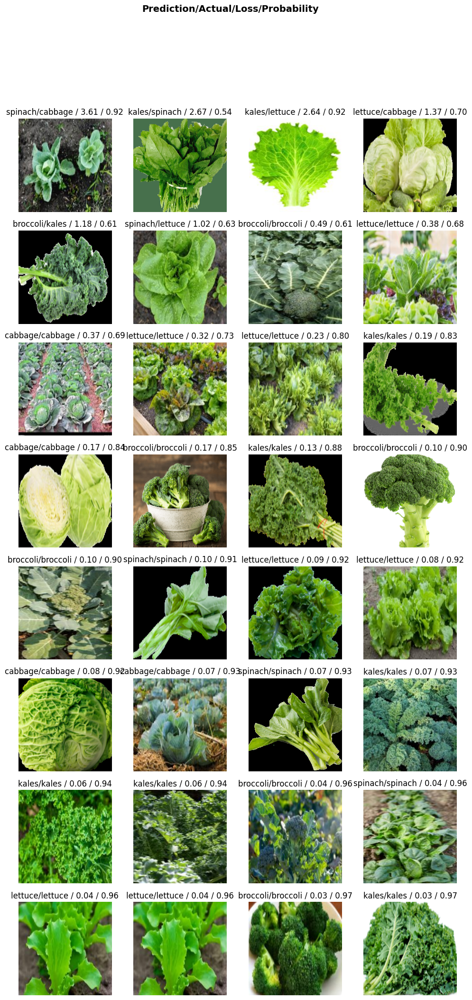

In [41]:
interp.plot_top_losses(32, nrows=8)

These are even better results. The model has improved alot, although there are still few errors. We can clean the data further and train the model further to see if we can reduce the loss further.

In [42]:
cleaner2 = ImageClassifierCleaner(clean_learner)
cleaner2

In [43]:
for idx in cleaner2.delete():
    cleaner2.fns[idx].unlink()
for idx,cat in cleaner2.change():
    shutil.move(str(cleaner2.fns[idx]), path/cat)

We can repeat the retraining cycle a few times to further edit the data _(I repeated three times before saving the first model)_.

After we are are satisfied with the retraining, and confident with our model, we export it.

## Export the veggie-detector model

In [44]:
clean_learner.export('veggie_detector_v0.pkl')

Now we have a vegetable classification model that can predict the category of an image whether it contains any vegetable among cabbage, broccoli, kale, spinach, and lettuce.

Let's test it.

Searching for 'Lettuce plant photo'


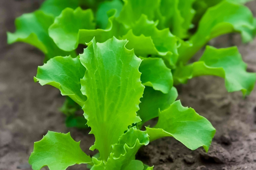

In [51]:
# download images for each category
#lettuce
download_url(
    url=search_images_ddg('Lettuce plant photo', 1)[0],
    dest='images/lettuce_img.jpg',
    show_progress=False
)
lettuce_img = Image.open('images/lettuce_img.jpg').to_thumb(256,256)
lettuce_img

Searching for 'Kale plant photo'


/opt/conda/lib/python3.10/site-packages/duckduckgo_search/compat.py:40: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")


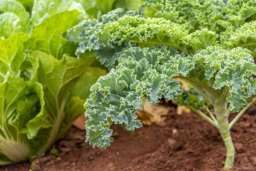

In [71]:
# kale
download_url(
    url=search_images_ddg('Kale plant photo', 3)[1],
    dest='images/kale_img.jpg',
    show_progress=False
)
kale_img = Image.open('images/kale_img.jpg').to_thumb(256,256)
kale_img

Searching for 'Spinach plant photo'


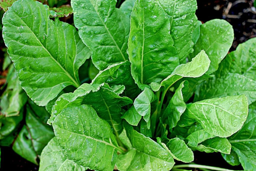

In [52]:
# spinach
download_url(
    url=search_images_ddg('Spinach plant photo', 1)[0],
    dest='images/spinach_img.jpg',
    show_progress=False
)
spinach_img = Image.open('images/spinach_img.jpg').to_thumb(256,256)
spinach_img

Searching for 'Broccoli plant photo'


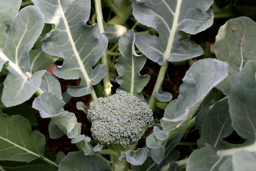

In [53]:
# broccoli
download_url(
    url=search_images_ddg('Broccoli plant photo', 1)[0],
    dest='images/broccoli_img.jpg',
    show_progress=False
)
broccoli_img = Image.open('images/broccoli_img.jpg').to_thumb(256,256)
broccoli_img

Searching for 'Cabbage plant photo'


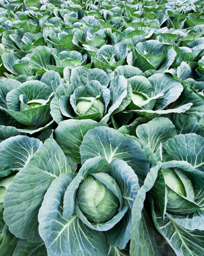

In [72]:
# cabbage
download_url(
    url=search_images_ddg('Cabbage plant photo', 3)[2],
    dest='images/cabbage_img.jpg',
    show_progress=False
)
cabbage_img = Image.open('images/cabbage_img.jpg').to_thumb(256,256)
cabbage_img

We have the images we need to test our model.

We will use the saved model.

In [84]:
def download_veg(veg, dest):
    download_url(
        url=search_images_ddg(f'{veg} plant photo', 3)[1],
        dest=dest,
        show_progress=False
    )
    
    veg_img = Image.open(dest).to_thumb(256,256)
    veg_img
    return veg_img

def test_vegetable(vegetable, inf_model='veggie_detector_v0.pkl'):
    vegetable = vegetable.lower()
    dest = f'images/{vegetable}_img.jpg'
    
    download_veg(vegetable, dest)
    
    is_veg,_,pb = load_learner(Path(inf_model)).predict(dest)
    
    print(f"This is a {is_veg}.")
    print(f"Probability it is a {vegetable}: {float(pb[_])*100:.{2}f}%")
    print(f"Prediction index _: {_}/5")

In [86]:
# Test it can detect/classify cabbage
test_vegetable('cabbage')

Searching for 'cabbage plant photo'


/opt/conda/lib/python3.10/site-packages/duckduckgo_search/compat.py:40: UserWarning: ddg_images is deprecated. Use DDGS().images() generator
  warnings.warn("ddg_images is deprecated. Use DDGS().images() generator")


This is a lettuce.
Probability it is a cabbage: 90.46%
Prediction index _: 3/5


In [87]:
# test broccoli
test_vegetable('broccoli')

Searching for 'broccoli plant photo'


This is a broccoli.
Probability it is a broccoli: 99.74%
Prediction index _: 0/5


In [88]:
# test kale
test_vegetable('kale')

Searching for 'kale plant photo'


This is a kales.
Probability it is a kale: 81.24%
Prediction index _: 2/5


In [91]:
# test lettuce
test_vegetable('lettuce')

Searching for 'lettuce plant photo'


This is a lettuce.
Probability it is a lettuce: 94.64%
Prediction index _: 3/5


In [90]:
# test spinach
test_vegetable('spinach')

Searching for 'spinach plant photo'


This is a spinach.
Probability it is a spinach: 95.31%
Prediction index _: 4/5


# Conclusion

The above results demonstrate that our model works as expected. It can correctly classify vegetables with over 90% accuracy most of the time.

This activity has achieved the following:
1. Cleaning up training data by, first, training a model.
2. Using the cleaned-up data and a pretrained `resnet50` model to create a better model that can predict the correct category of the vegetable image with over 90% accuracy.
3. Created an `veggie_detector_v0.pkl` that can classify images of broccoli, cabbages, kales, lettuce, and spinach.

The `veggie_detector` demonstrates how DL techniques such as **image classification** provide a powerful tool that farmers can leverage to improve food production and farming outcomes.

Technology, especially ML, provides an opportunity to advance farming and agricultural practices across the world and can help solve food security in many areas across Africa and the world. My interest in DL is to learn techniques that can be leveraged by small scale farmers in rural areas to improve their farm output at low costs.

# References
1. Fastai course Lessons 1,2 and 3 [course.fast.ai](https://course.fast.ai)
2. [ImageClassifierCleaner - Cleaning multiple folders](https://forums.fast.ai/t/imageclassifiercleaner-cleaning-multiple-folders/89330/5)
3. [Which image models are best? - nb by Jeremy Howard on kaggle.com](https://www.kaggle.com/code/jhoward/which-image-models-are-best)
4. Resources on [fastai's github - fastbook, course22, course-v3](https://github.com/fastai/)
5. Hu, K., Wang, Z., Coleman, G. et al. Deep learning techniques for in-crop weed recognition in large-scale grain production systems: a review. Precision Agric (2023). https://doi.org/10.1007/s11119-023-10073-1
